# <center> ***Visión computacional para imágenes y video*** </center>
## <center> ***10. Morphological Operations*** </center>
### Profesor: Gilberto Ochoa Ruiz
### Alumnos:
* Alberto Nieves Cisneros            A01793829
* Aurelio Antonio Lozano Rábago      A01081266
* Héctor Manuel González Villareal   A00178679
* Jessica Lechuga Ramos              A01793512
* Luis Alfredo Negron Naldos         A01793865

#### <p style='text-align: right;'> 5 de Febrero del 2023 </p>

## Table of Contents
1. [Libraries](#libraries)
2. [Erosion](#erosion)
3. [Dilation](#dilation)
4. [Opening](#opening)
5. [Closing](#closing)
6. [Morphological Gradient](#gradient)
7. [Morphological Hats](#hats)
   1. [Top or White Hat](#top)
   1. [Black Hat](#black)
8. [Exercises](#exercises)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from scipy.ndimage.filters import median_filter as med

C:\Users\mapc1\AppData\Local\Temp\ipykernel_5832\4030325632.py:4: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter as med


In [2]:
img = cv2.imread("data/image.jpg")
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("data/image.jpg",0)

(400, 700, 3) (400, 700, 3) (400, 700)


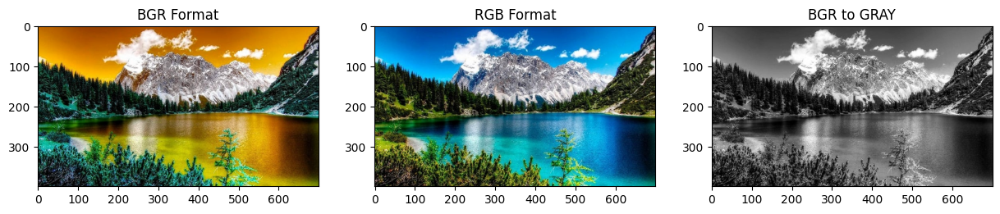

In [3]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('BGR Format')
    plt.imshow(img)

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('RGB Format')
    plt.imshow(img1)

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('BGR to GRAY')
    plt.imshow(img2,cmap="gray")
    plt.show()
    
imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3)

## Erosion <a class="anchor" id="erosion" ></a>

Erosin primarily involves eroding(thinning) outer surface(foreground) of image
- Tt is suggested to have foreground as white

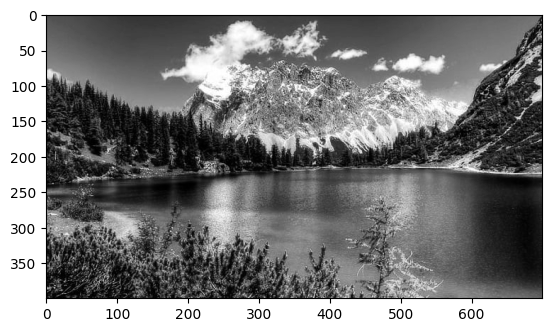

In [4]:
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

Eroding boundy of image upto 3 level

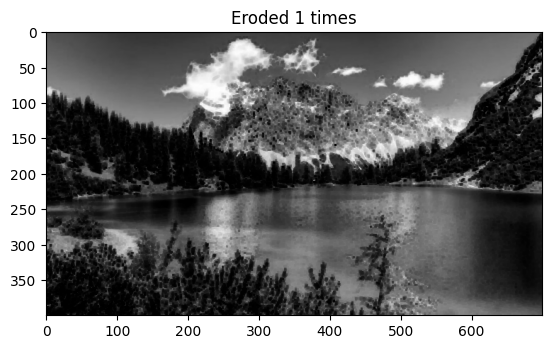

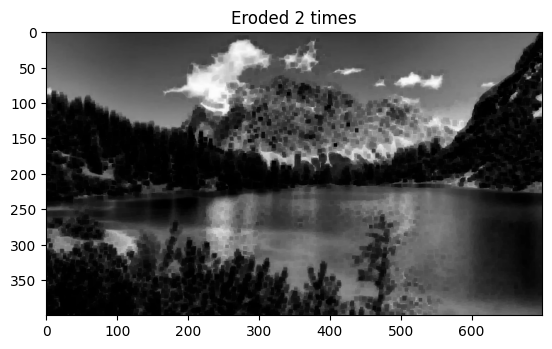

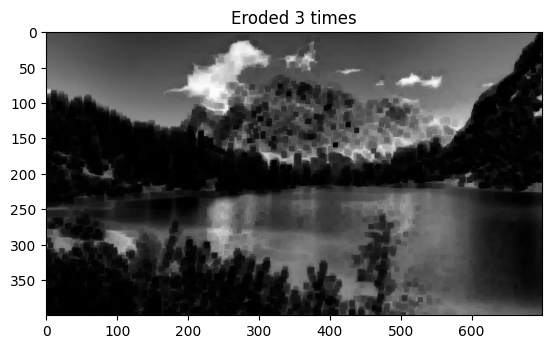

In [5]:
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()
    
for i in range(0,3):
    eroded = cv2.erode(BGR2GRAY.copy(), None, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

### Binarize Image

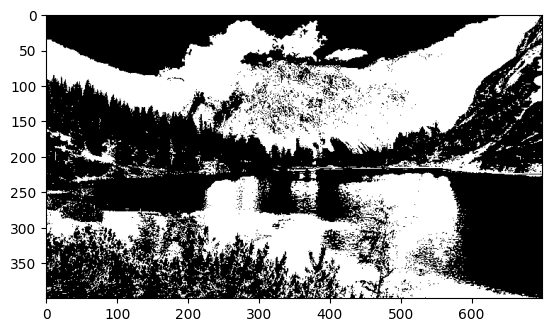

In [6]:
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

### We can Invert Image to keep foreground in white

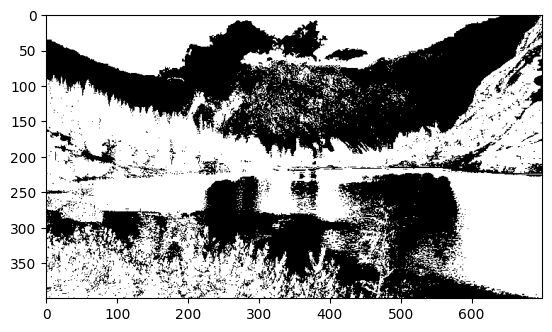

In [7]:
invert = cv2.bitwise_not(binr)
image = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

Then, we can define a kernel of $5 \times 5$ to use in erosion

In [8]:
kernel = np.ones((5,5), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


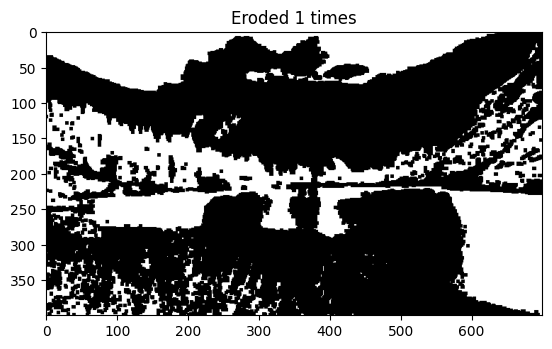

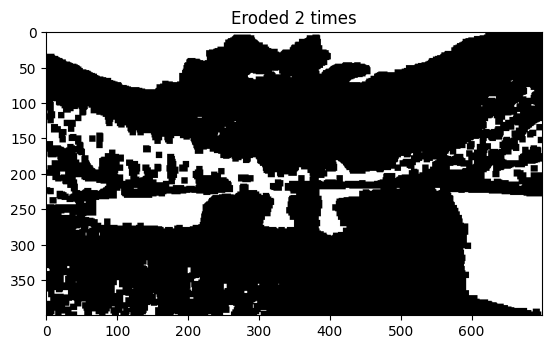

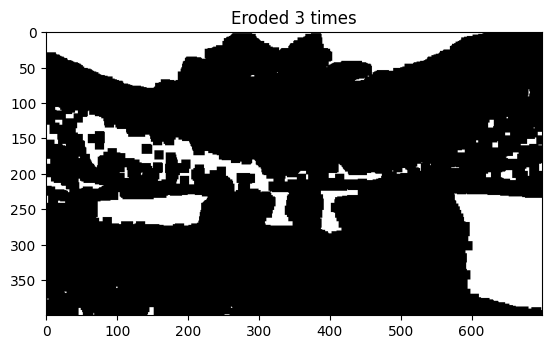

In [9]:
for i in range(0,3):
    eroded = cv2.erode(invert.copy(),kernel=kernel, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

## Dilation <a class="anchor" id="dilation" ></a>

Involves dilating outer surface (foreground) of image
- For joining broken parts of an image together

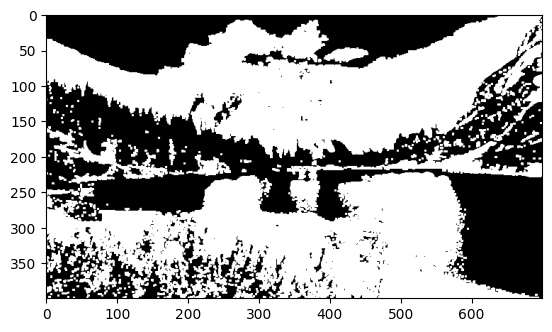

In [10]:
#binarize image
binr = cv2.threshold(BGR2GRAY,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
kernel = np.ones((3,3),np.uint8)
invert = cv2.bitwise_not(binr)

#dilate image
dilation = cv2.dilate(binr, kernel, iterations=1)
 
plt.imshow(dilation, cmap='gray')
plt.show()

We can apply series of dilations on inverted image using no kernel


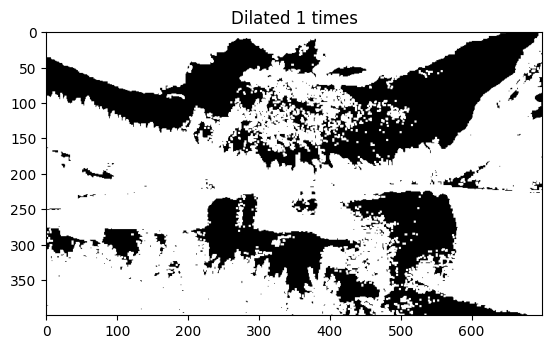

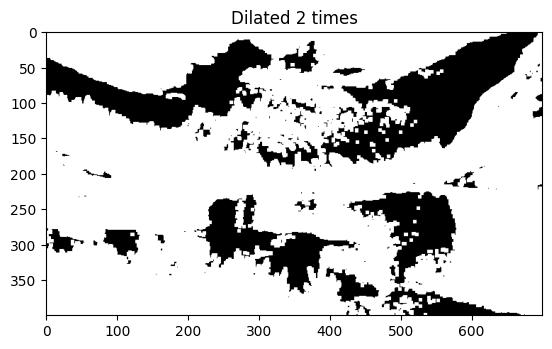

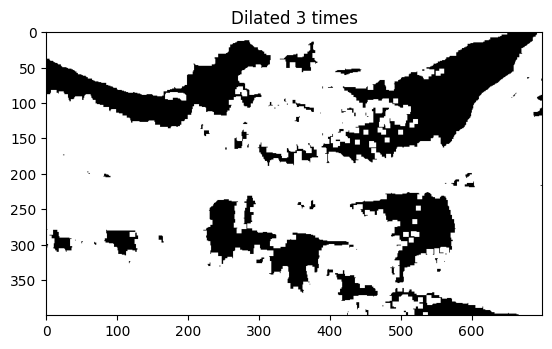

In [11]:
for i in range(0,3):
    dilated = cv2.dilate(invert.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

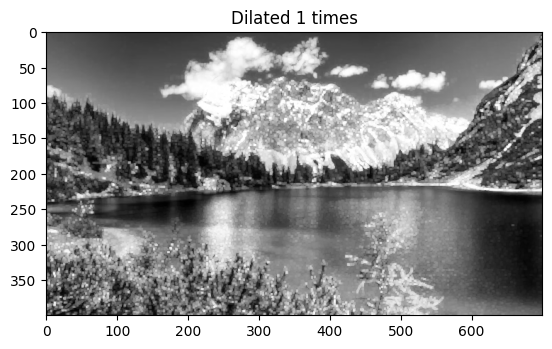

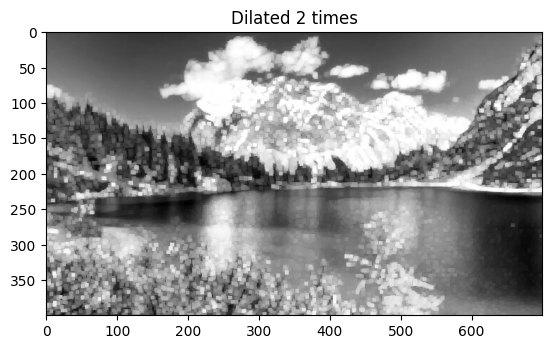

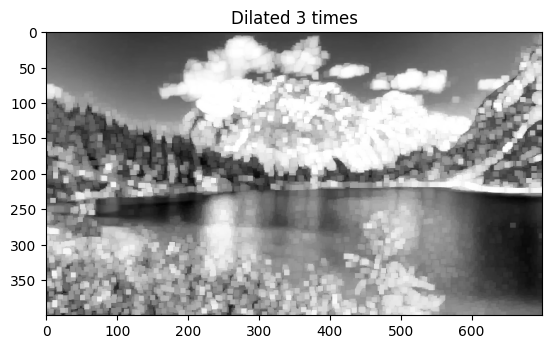

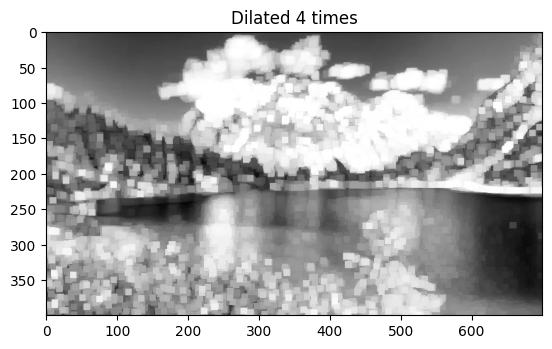

In [12]:
for i in range(0,4):
    dilated = cv2.dilate(BGR2GRAY.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

## Opening <a class="anchor" id="opening" ></a>

Erosion followed by dilation in outer surface (foreground) of image
- Generally used to remove noise (small blobs) in image


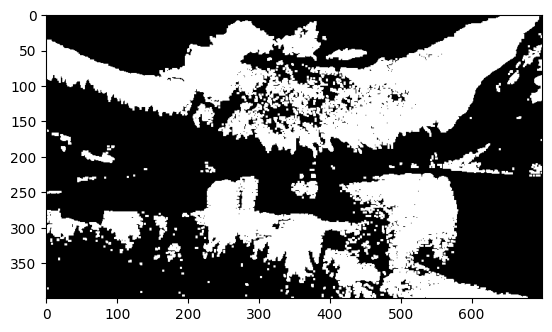

In [13]:
#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

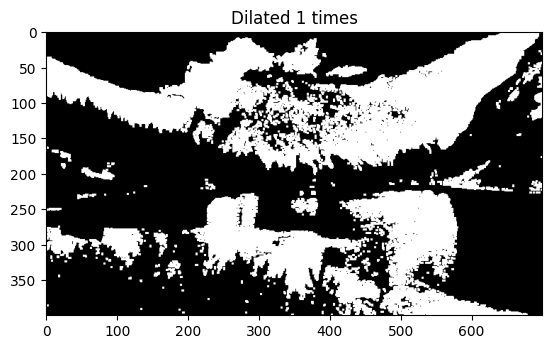

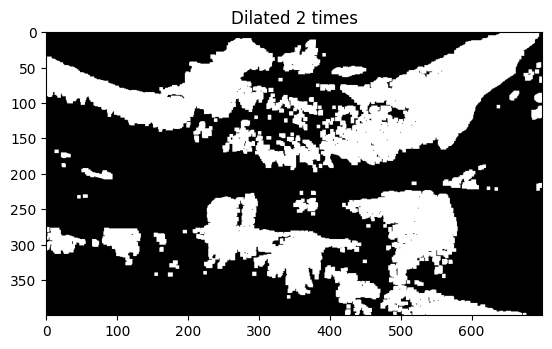

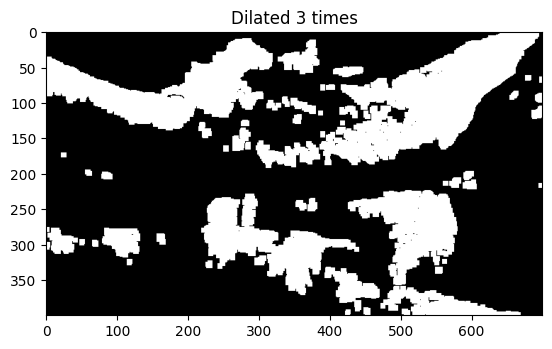

In [14]:
for i in range(0,3):
    opening = cv2.morphologyEx(binr.copy(),cv2.MORPH_OPEN,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),opening)
    plt.show()

## Closing <a class="anchor" id="closing" ></a>

Dilation followed by erosion in outer surface (foreground) of image
- Generally used to close holes inside of objects or for connecting components together

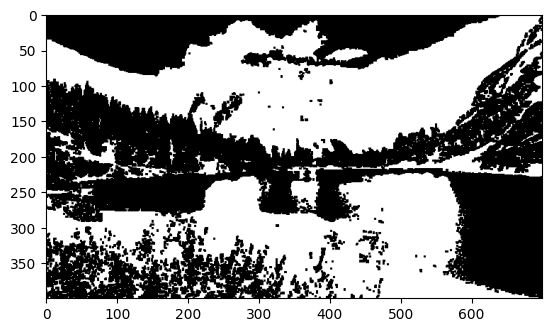

In [15]:
#closing image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)
 
#print output
plt.imshow(closing,cmap='gray')
plt.show()

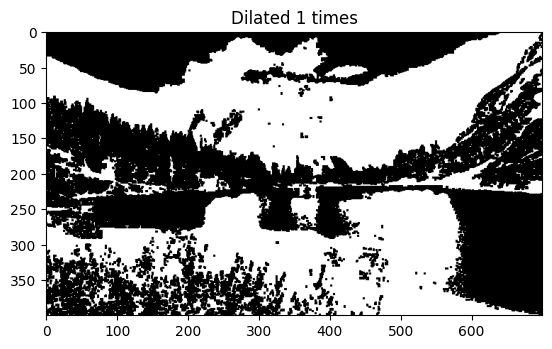

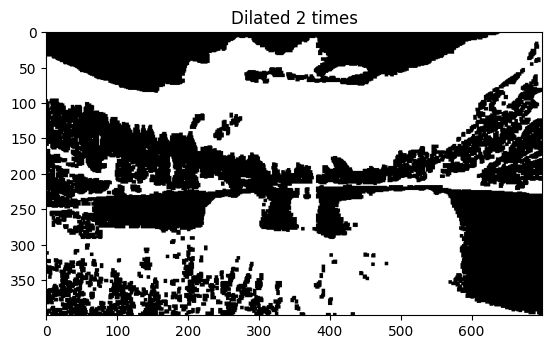

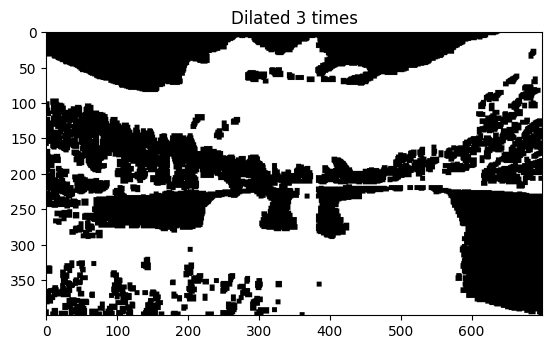

In [16]:
for i in range(0,3):
    closing = cv2.morphologyEx(binr.copy(),cv2.MORPH_CLOSE,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),closing)
    plt.show()

Iterating with different kernels

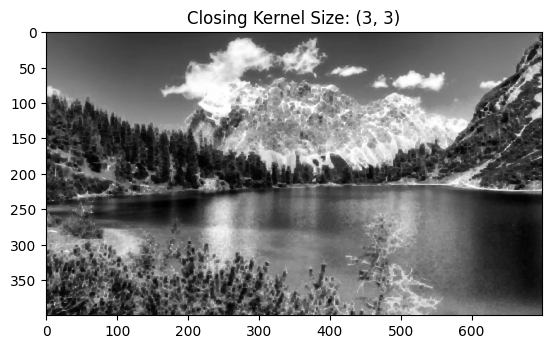

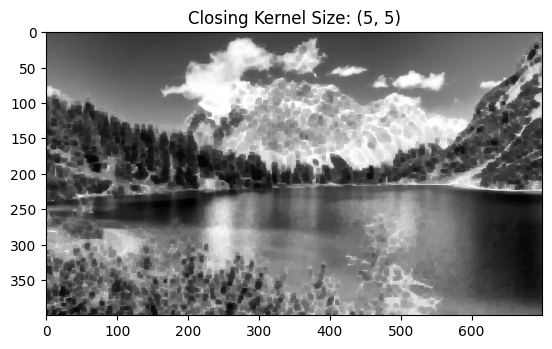

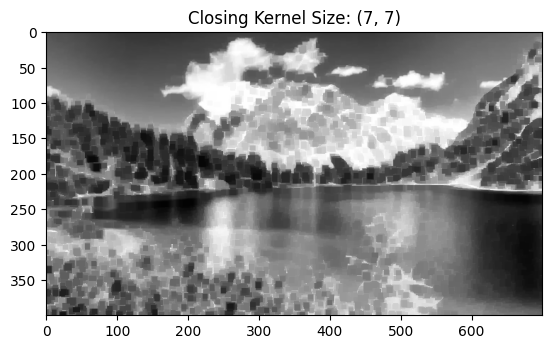

In [17]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    closing = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_CLOSE, kernel)
    plt_imshow("Closing Kernel Size: ({}, {})".format(kernelSize[0], kernelSize[1]), closing)

## Morphological Gradient <a class="anchor" id="gradient" ></a>

It first applies erosion and dilation individually on image and then computes difference between eroded and dilated image

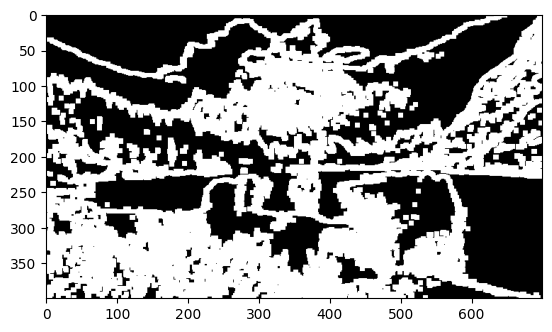

In [18]:
# use morph gradient
morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel)
 
#print output
plt.imshow(morph_gradient, cmap='gray')
plt.show()

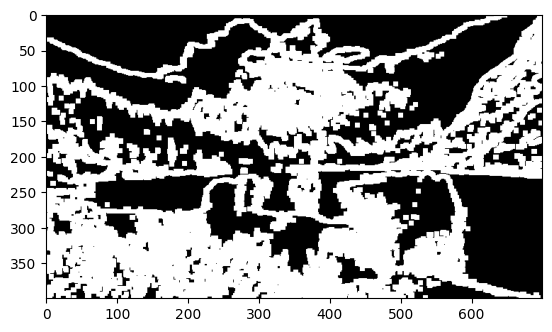

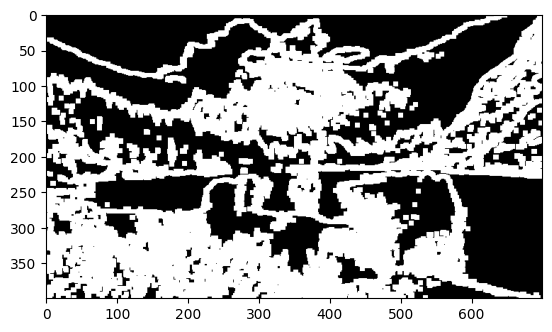

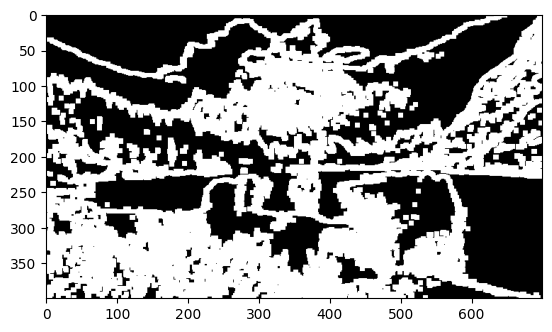

In [19]:
for i in range(0,3): 
    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel+i)
    #print output
    plt.imshow(morph_gradient, cmap='gray')
    plt.show()

Iterating with different kernels

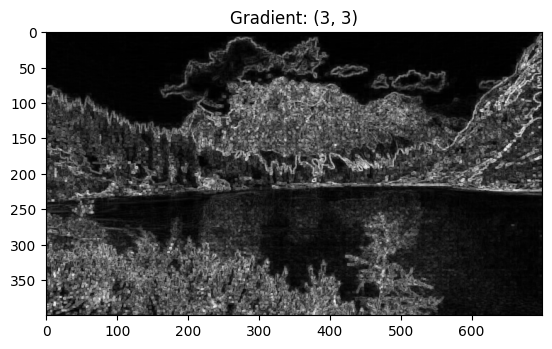

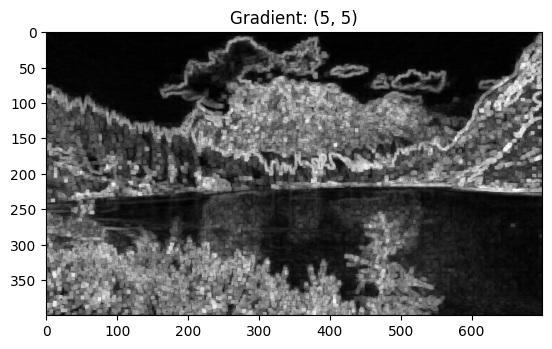

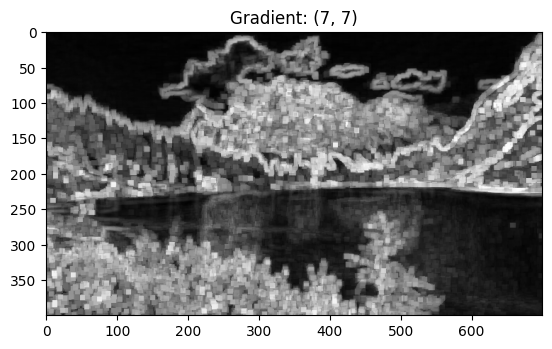

In [20]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    gradient = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_GRADIENT, kernel)
    plt_imshow("Gradient: ({}, {})".format(
        kernelSize[0], kernelSize[1]), gradient)

## Morphological Hats <a class="anchor" id="hats" ></a>

1. Top or White Hat
2. Black hat

### Top or White Hat <a class="anchor" id="top" ></a>

It is the difference between original (grayscale/single channel) input image and opening image

- Finds light(bright) regions of an image on dark background


In [21]:
#construct a kernel (13x5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
kernel

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

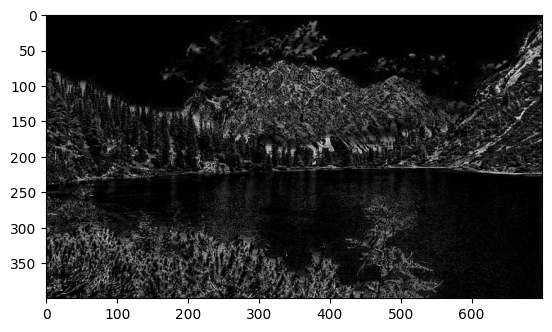

In [22]:
tophat = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_TOPHAT, kernel)

plt.imshow(tophat, cmap='gray')
plt.show()

### Black Hat <a class="anchor" id="black" ></a>

Output is a difference between input image & opened image
- Finds dark regions on a light background


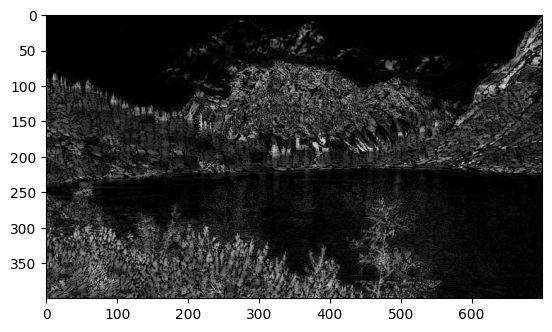

In [23]:
blackhat = cv2.morphologyEx(BGR2GRAY,cv2.MORPH_BLACKHAT,kernel)

plt.imshow(blackhat, cmap='gray')
plt.show()

## Implementar los siguientes ejercicios<a class="anchor" id="exercises"></a>:

1. Investigar una aplicación de erosión en procesamiento de imágenes e implementarlo en Colab
2. Investigar una aplicación de dilatación en procesamiento de imágenes e implementarlo en Colab
3. Investigar una aplicación de opening y closing e implementalo en Google Colab

## Ejercicio 1
Investigar una aplicación de erosión en procesamiento de imágenes e implementarlo en Colab

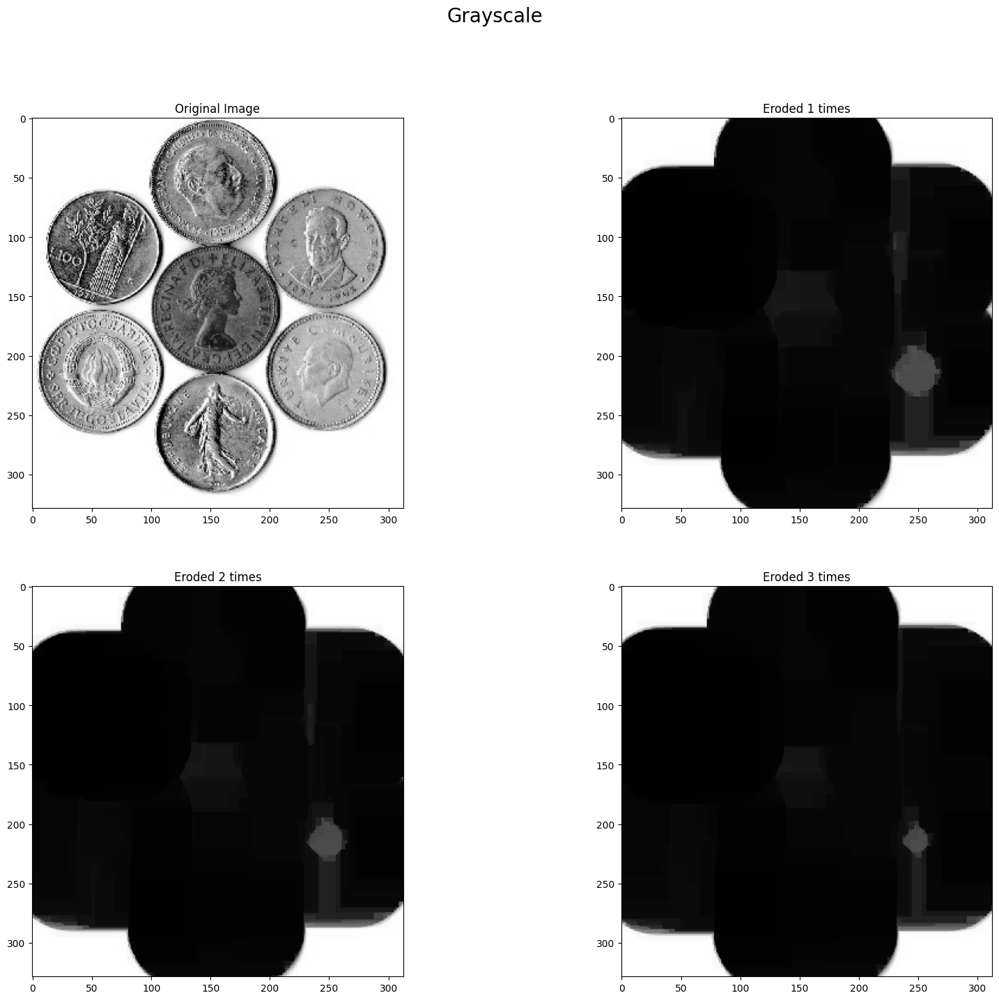

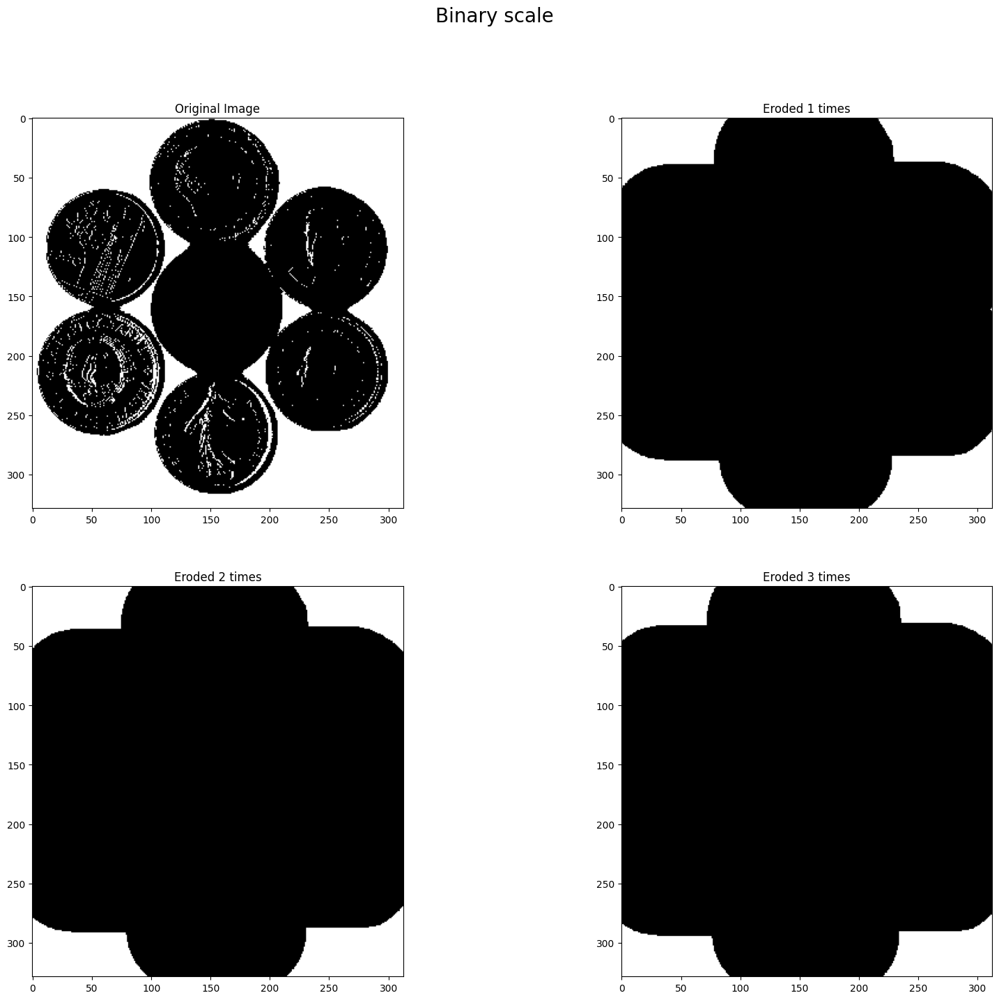

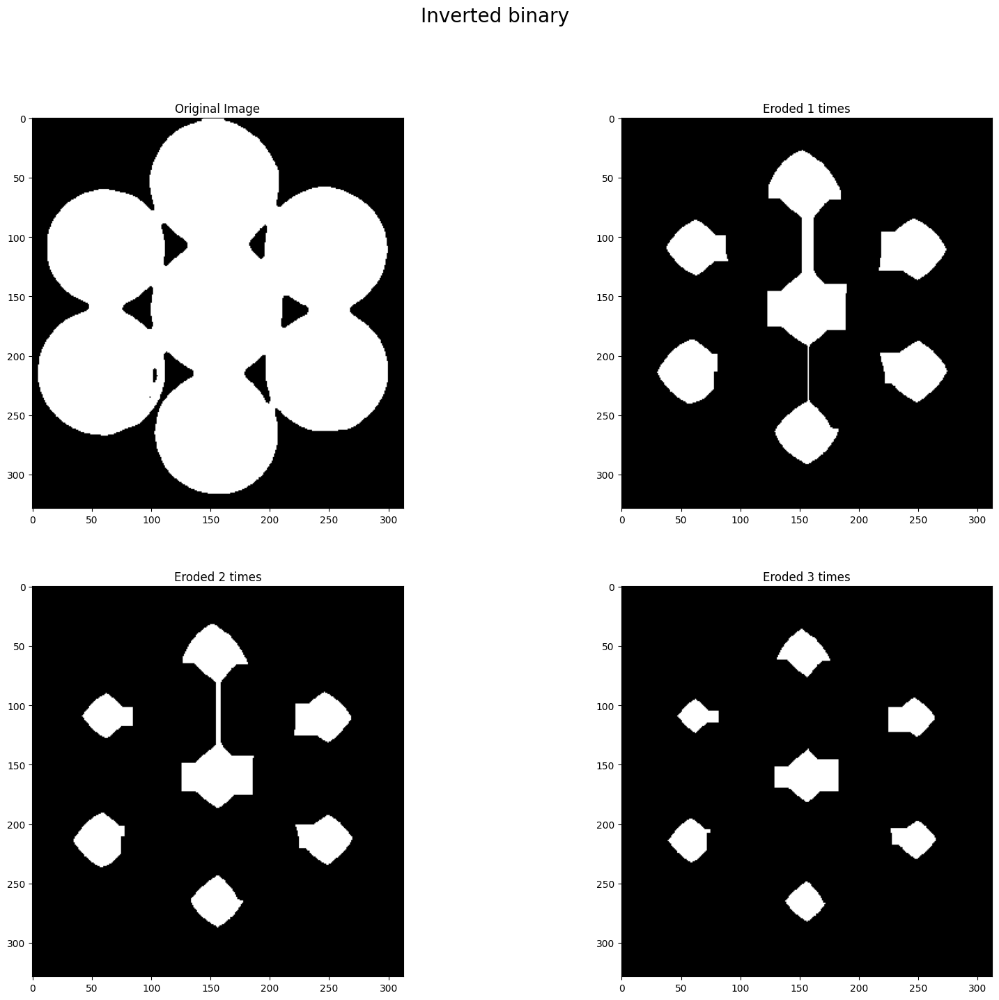

In [40]:
size_kernel = 7
#Creating kernel
kernel = np.ones((size_kernel, size_kernel), np.uint8)
#Import image
img = cv2.imread("data/Coins.jpg")

#------------------------------------------------------------------------------------------------------------------
#Convert the image to Grayscale
BGR2GRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#GRAY
fig = plt.figure(figsize=(20, 16))
fig.suptitle("Grayscale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BGR2GRAY, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

for i in range(0,3):
    #Application of the method
    eroded = cv2.erode(BGR2GRAY.copy(), kernel=kernel, iterations=i + 7)
    # Subplot for processed image
    plt.subplot((221 + i + 1)), plt.imshow(cv2.cvtColor(eroded, cv2.COLOR_BGR2RGB))
    plt.title("Eroded {} times".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------------------
#Convert the image to binary scale
BINR = cv2.threshold(BGR2GRAY, 225, 255, cv2.THRESH_BINARY)[1]

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Binary scale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BINR, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

for i in range(0,3):
    #Application of the method
    eroded = cv2.erode(BINR.copy(), kernel=kernel, iterations=i + 7)
    # Subplot for processed image
    plt.subplot((221 + i + 1)), plt.imshow(cv2.cvtColor(eroded, cv2.COLOR_BGR2RGB))
    plt.title("Eroded {} times".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------------------
#Convert the image to inverted binary scale
INV = cv2.bitwise_not(BINR)
MED = med(INV, size=9)

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Inverted binary", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(MED, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

for i in range(0,3):
    #Application of the method
    eroded = cv2.erode(MED.copy(), kernel=kernel, iterations=i + 7)
    # Subplot for processed image
    plt.subplot((221 + i + 1)), plt.imshow(cv2.cvtColor(eroded, cv2.COLOR_BGR2RGB))
    plt.title("Eroded {} times".format(i+1))

plt.show()


Esta operación “afina” los objetos de una imagen binaria. La forma en que se erosionan los objetos depende de un elemento estructural.

- Una de las aplicaciones mas populares en la erosion es separar objetos que estan traslapados en una imagen binaria para que puedan ser contados usando un algoritmo de etiquetado.

- Una Aplicación muy comun es trabajar con las imagenes con muchas regiones brillantes (probablemente por la posición de las luces al momento de tomar la imagen), en este sentido por medio de la erosión se reduce el tamaño de las zonas brillantes y aumenta el tamaño de las zonas oscuras. Es decir las zonas pequeñas brillantes desaparecen o se minimizan. 

- Otra las aplicaciones es para limitar objetos que se tocan entre si en una imagen, al realizar la erosión de las mismas lo logramos separa y con esto es más fácil aplicar algoritmos de reconocimiento. 

- Finalmente la erosión tambien se usa para eliminar ruidos blancos o los denominados ruidos de sal. 

Referencia: Haralick, R. M., Sternberg, S. R., & Zhuang, X. (1987). Image analysis using mathematical morphology. IEEE transactions on pattern analysis and machine intelligence, (4), 532-550.

## Ejercicio 2
Investigar una aplicación de dilatación en procesamiento de imágenes e implementarlo en Colab

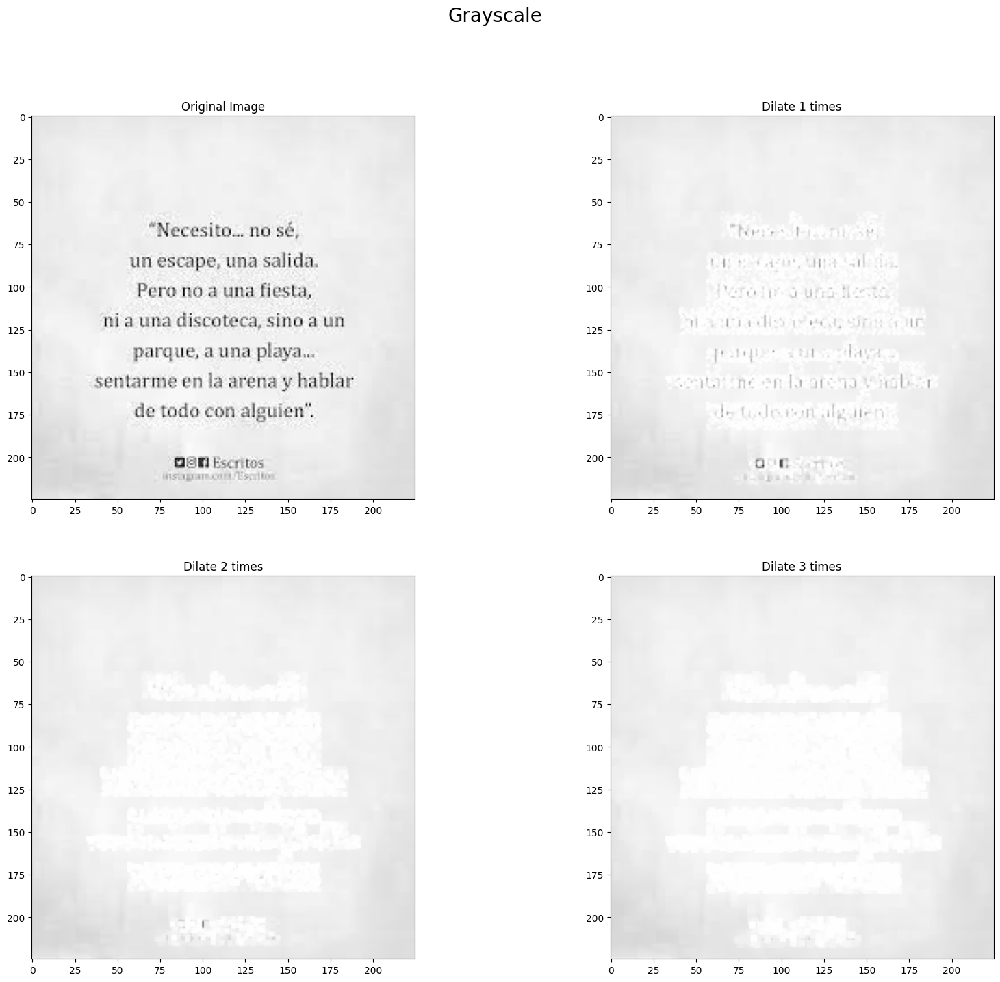

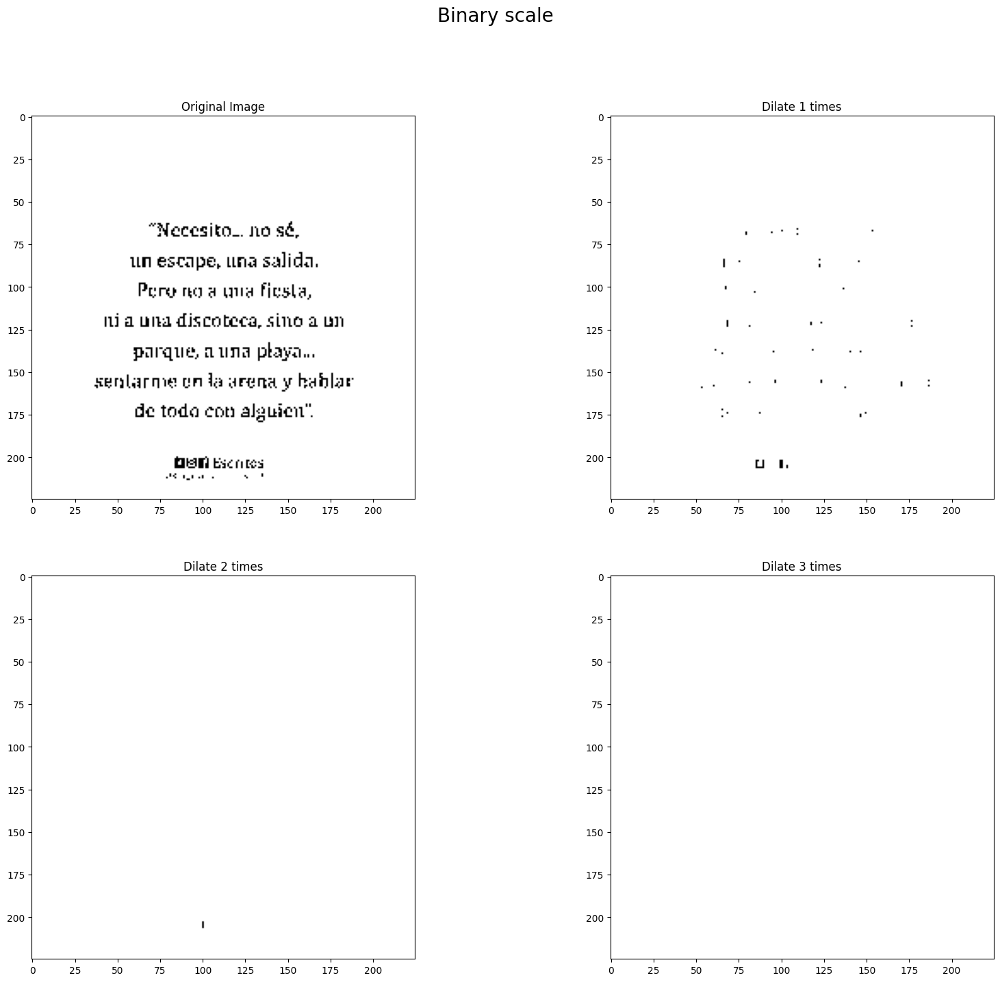

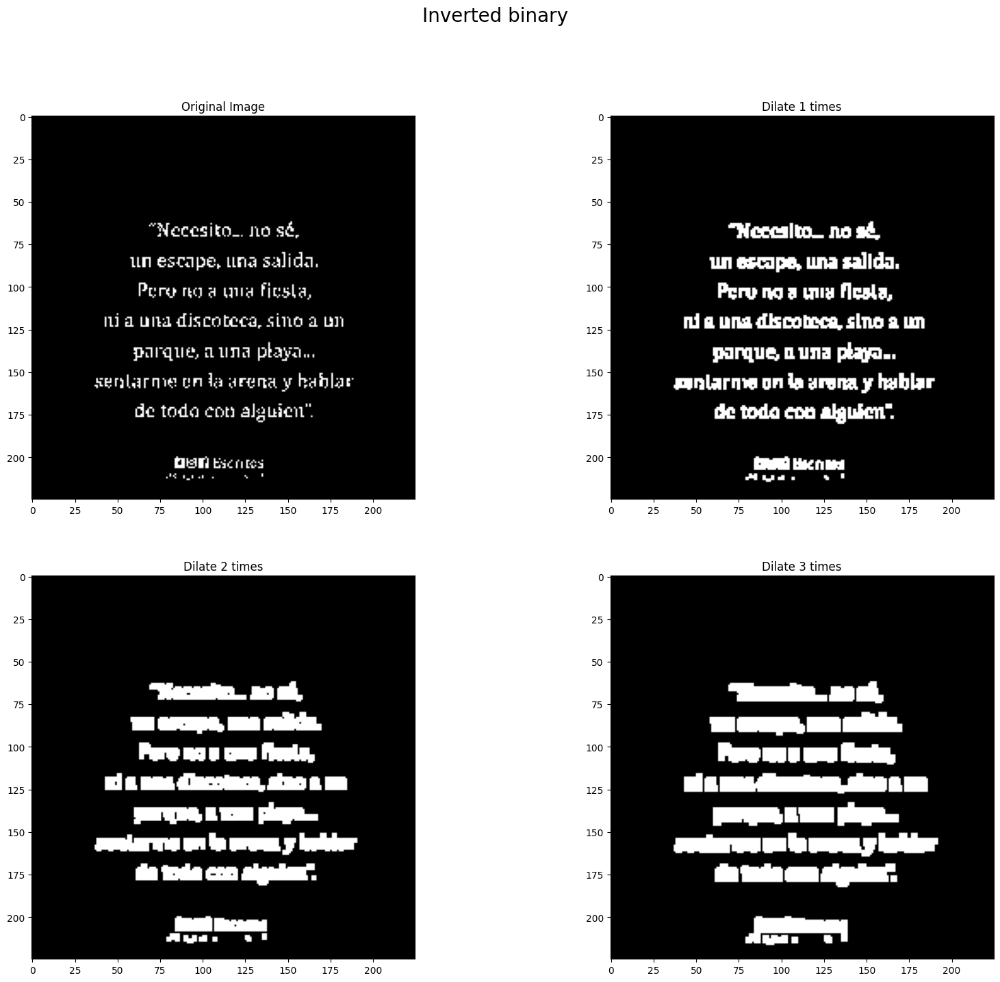

In [25]:
size_kernel = 2
#Creating kernel
kernel = np.ones((size_kernel, size_kernel), np.uint8)
#Import image
#img = cv2.imread("data/escrito.jpg")
#img = cv2.imread("data/s.png")
img = cv2.imread("data/dilate.jpeg")

#------------------------------------------------------------------------------------------------------------------
#Convert the image to Grayscale
BGR2GRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#Gray
fig = plt.figure(figsize=(20, 16))
fig.suptitle("Grayscale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BGR2GRAY, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

for i in range(0,3):
    #Application of the method
    dilate = cv2.dilate(BGR2GRAY.copy(), kernel=kernel, iterations=i+1)
    # Subplot for processed image
    plt.subplot((221 + i + 1)), plt.imshow(cv2.cvtColor(dilate, cv2.COLOR_BGR2RGB))
    plt.title("Dilate {} times".format(i+1))

plt.show()

#-------------------------------------------------------------------------------------
#Convert the image to binary scale
BINR = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Binary scale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BINR, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

for i in range(0,3):
    #Application of the method
    dilate = cv2.dilate(BINR.copy(), kernel=kernel, iterations=i+1)
    # Subplot for processed image
    plt.subplot((221 + i + 1)), plt.imshow(cv2.cvtColor(dilate, cv2.COLOR_BGR2RGB))
    plt.title("Dilate {} times".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------------------
#Convert the image to inverted binary scale
INV = cv2.bitwise_not(BINR)

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Inverted binary", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(INV, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

for i in range(0,3):
    #Application of the method
    dilate = cv2.dilate(INV.copy(), kernel=kernel, iterations=i+1)
    # Subplot for processed image
    plt.subplot((221 + i + 1)), plt.imshow(cv2.cvtColor(dilate, cv2.COLOR_BGR2RGB))
    plt.title("Dilate {} times".format(i+1))

plt.show()

Esta operación “aumenta” o “engrosa” los objetos de una imagen binaria. La forma en que se engrosan los objetos depende de un elemento estructural.

A continuación se presentan las aplicaciones para el proceso de "Dilatación":

- Como es conocido una de las ventajas de la dilatación es lograr resaltar aquellos contornos o zonas tan definidas para posteriormente realizar una segmentación. En este sentido una amplia aplicación a este concepto se da en el procesamiento de imagenes a tiempo real en los sistemas de endoscopia. (Kang & Doraiswami, 2003)

- Otra aplicación es que este algoritmo es usado en la reconstrucción de imagenes digitales en escala de grises, como lo comenta Soille (1999), actualmente este modelo de reconstrucción ya ha sido actualizado con las herramientas modernas pero sigue teniendo el mismo principio de apliación.

- Una de las aplicaciones de la Dilatacion puede ser convertir a negritas texto y con esyo ayudar al reconocimiento de las letras en procesos de pasar imagenes a texto. 

Referencia:

- Kang, J., & Doraiswami, R. (2003, May). Real-time image processing system for endoscopic applications. In CCECE 2003-Canadian Conference on Electrical and Computer Engineering. Toward a Caring and Humane Technology (Cat. No. 03CH37436) (Vol. 3, pp. 1469-1472). IEEE.

- Soille, P. (1999). Morphological image analysis: principles and applications (Vol. 2, No. 3, pp. 170-171). Berlin: Springer.

## Ejercicio 3
Investigar una aplicación de opening y closing e implementalo en Google Colab

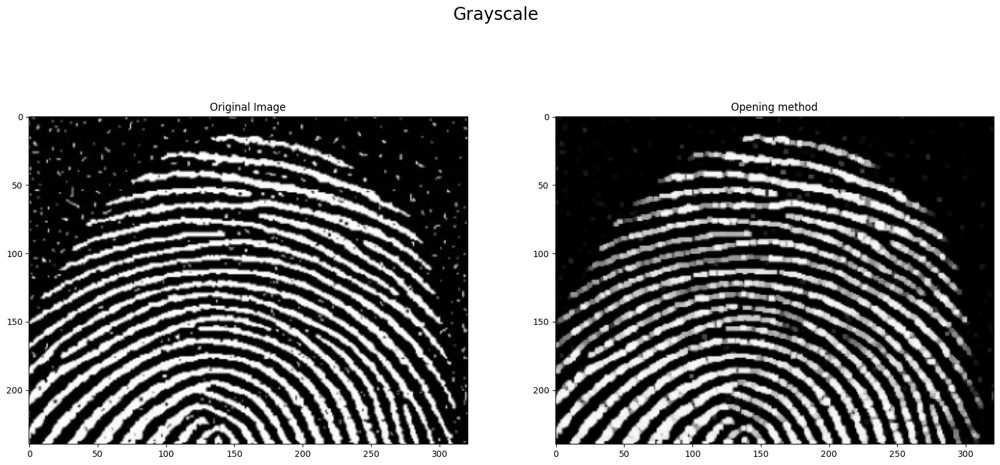

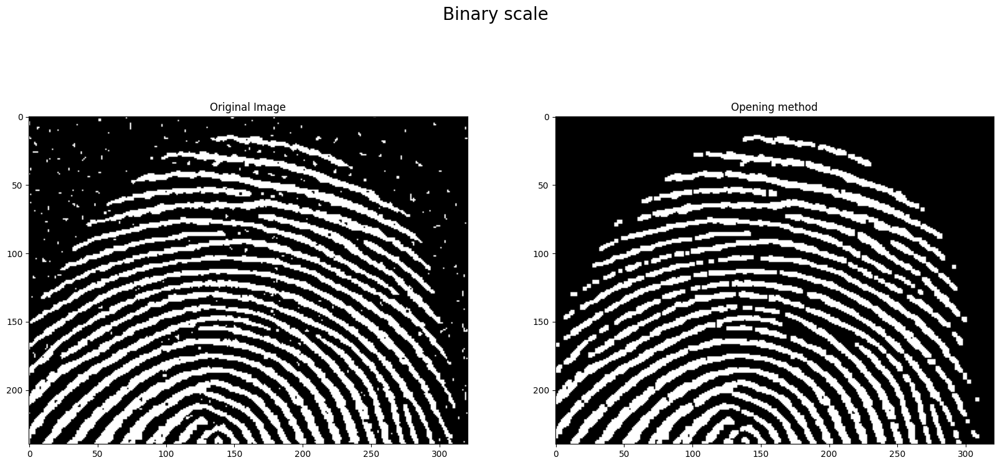

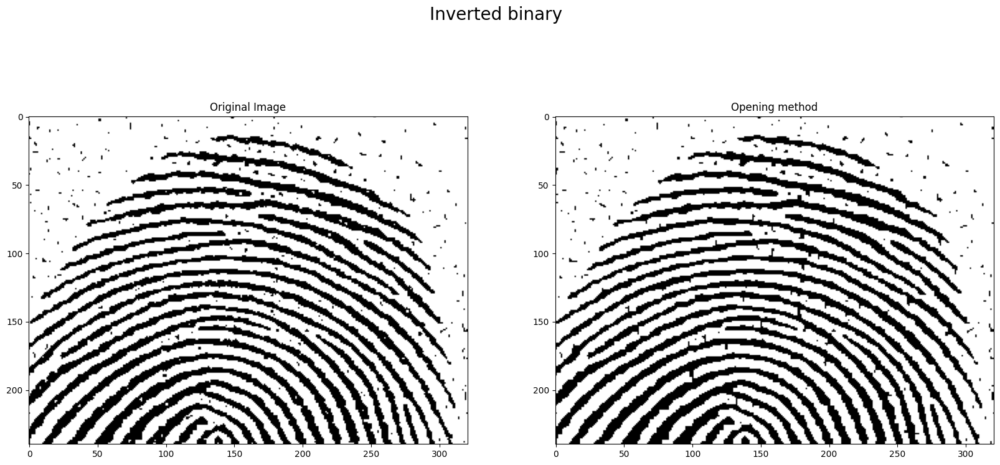

In [41]:
size_kernel = 3
#Creating kernel
kernel = np.ones((size_kernel, size_kernel), np.uint8)
#Import image
img = cv2.imread("data/finger.jpg")

#------------------------------------------------------------------------------------------------------------------
#Convert the image to Grayscale
BGR2GRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Grayscale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BGR2GRAY, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

#Application of the method
opening = cv2.morphologyEx(BGR2GRAY.copy(), cv2.MORPH_OPEN, kernel)
# Subplot for processed image
plt.subplot(222), plt.imshow(cv2.cvtColor(opening, cv2.COLOR_BGR2RGB))
plt.title("Opening method".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------
#Convert the image to binary scale
BINR = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Binary scale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BINR, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

#Application of the method
opening = cv2.morphologyEx(BINR.copy(), cv2.MORPH_OPEN, kernel)
# Subplot for processed image
plt.subplot(222), plt.imshow(cv2.cvtColor(opening, cv2.COLOR_BGR2RGB))
plt.title("Opening method".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------------------
#Convert the image to inverted binary scale
INV = cv2.bitwise_not(BINR)

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Inverted binary", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(INV, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

#Application of the method
opening = cv2.morphologyEx(INV.copy(), cv2.MORPH_OPEN, kernel)
# Subplot for processed image
plt.subplot(222), plt.imshow(cv2.cvtColor(opening, cv2.COLOR_BGR2RGB))
plt.title("Opening method".format(i+1))

plt.show()


La operación de apertura erosiona una imagen y, después, dilata la imagen erosionada utilizando el mismo elemento estructurante para ambas operaciones.

La apertura morfológica es útil para eliminar objetos pequeños y líneas finas de una imagen a la vez que se conservan la forma y el tamaño de los objetos más grandes de la imagen.

Closing

se puede usar para cerrar huecos y eliminar pequeños espacios, por lo que pudiera usarse para detectar fresas entre berries

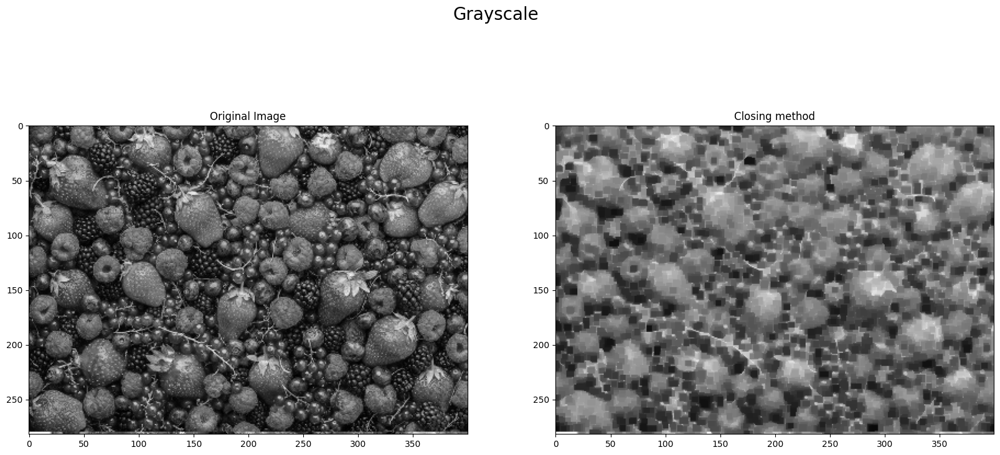

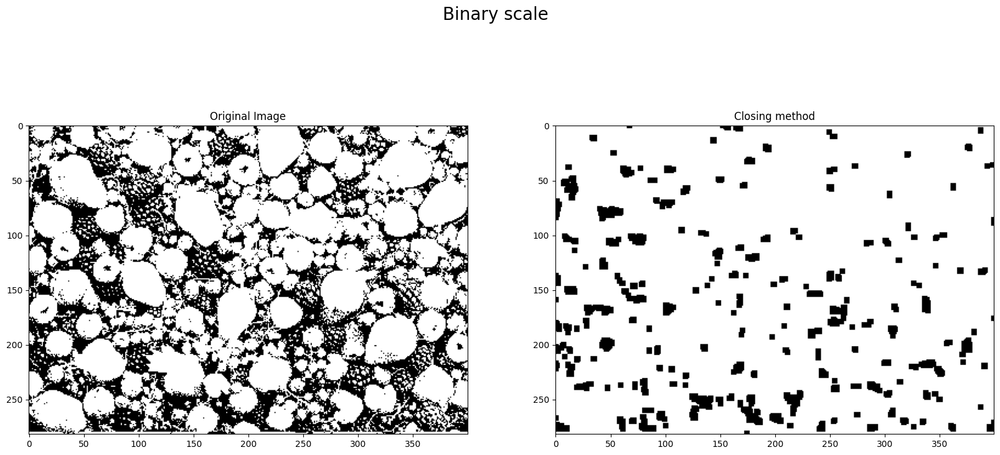

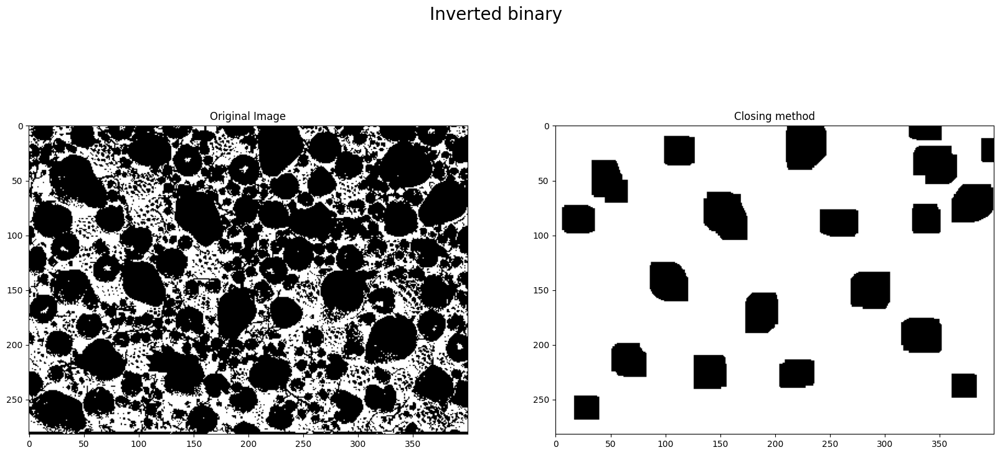

In [45]:
size_kernel = 5
#Creating kernel
kernel = np.ones((size_kernel, size_kernel), np.uint8)
#Import image
img = cv2.imread("data/berries.jpg")

#------------------------------------------------------------------------------------------------------------------
#Convert the image to grayscale
BGR2GRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#Gray
fig = plt.figure(figsize=(20, 16))
fig.suptitle("Grayscale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BGR2GRAY, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

#Application of the method
closing = cv2.morphologyEx(BGR2GRAY.copy(), cv2.MORPH_CLOSE, kernel)
# Subplot for processed image
plt.subplot(222), plt.imshow(cv2.cvtColor(closing , cv2.COLOR_BGR2RGB))
plt.title("Closing method".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------
#Convert the image to binary scale
BINR = cv2.threshold(BGR2GRAY, 50, 255, cv2.THRESH_BINARY)[1]

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Binary scale", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(BINR, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

#Application of the method
closing = cv2.morphologyEx(BINR.copy(), cv2.MORPH_CLOSE, kernel)
# Subplot for processed image
plt.subplot(222), plt.imshow(cv2.cvtColor(closing , cv2.COLOR_BGR2RGB))
plt.title("Closing method".format(i+1))

plt.show()

#------------------------------------------------------------------------------------------------------------------
#Convert the image to inverted binary scale
INV = cv2.bitwise_not(BINR)

fig = plt.figure(figsize=(20, 16))
fig.suptitle("Inverted binary", size=20)

# Subplot for original image
plt.subplot(221), plt.imshow(cv2.cvtColor(INV, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

#Application of the method
closing = cv2.morphologyEx(INV.copy(), cv2.MORPH_CLOSE, kernel, iterations=5)
# Subplot for processed image
plt.subplot(222), plt.imshow(cv2.cvtColor(closing , cv2.COLOR_BGR2RGB))
plt.title("Closing method".format(i+1))

plt.show()

La operación de cierre dilata una imagen y, después, erosiona la imagen dilatada utilizando el mismo elemento estructurante para ambas operaciones.

El cierre morfológico es útil para rellenar huecos pequeños en una imagen a la vez que se conservan la forma y el tamaño de los huecos y objetos grandes de la imagen.

- Ambos procesos dependen de las características del elemento que se desea trabajar para procesar la imagen con el fin de obtener una imagen mejor como es en la aplicación del uso de esta herramienta para mejorar imagenes que requiere procesamiento digital como el utilizado para el DNA. (Said, Jambek & Sulaiman, 2016)

- El opening es una técnica muy usada para resaltar zonas o áreas sub marcadas, de estar manera facilita el reconocimiento de imagenes en proceso continuos. Esta técnica es usada para mejorar la identificación de zonas o segmentos en los microscopios digitales. (Vincent, 1993).

- En sentido contrario el closing es usado para remover ruidos en las imagenes como las que se obtienen de micoscopios electrónicos. 


Referencia: 

- Vincent, L. (1993, May). Grayscale area openings and closings, their efficient implementation and applications. In First Workshop on Mathematical Morphology and its Applications to Signal Processing (pp. 22-27).

- Said, K. A. M., Jambek, A. B., & Sulaiman, N. (2016). A study of image processing using morphological opening and closing processes. International Journal of Control Theory and Applications, 9(31), 15-21.

# Bibliografía
* https://homepages.inf.ed.ac.uk/rbf/HIPR2/erode.htm